###Image Analysis

####Theoretical Part

a) How does the value of α affect the Gaussian pyramid?

The parameter α defines the weights of the filter used at each level of the pyramid. Large values of the parameter lead to less blurring since the current pixel will have the largest weight. This results in the edges/high-frequency components being preserved to a greater extent, and visually the images are crisper and have good contrast. However, during the downsampling stage, aliasing phenomena are much more likely to occur. Thus, overall, the pyramid has high-quality images at the initial levels, but as we go up, aliasing phenomena will be observed. On the other hand, small values of the parameter α result in the blurring of the images very quickly, leading to the loss of image details very early on. That is, in the pyramid, as we go higher, the image becomes more blurred, and at the last levels, it will not be recognizable. An ideal value of α would be in the middle of the previous two cases, around (0.4-0.6), where in our pyramid, at each level, the image is simplified efficiently without losing many details. Finally, it is worth noting that the form of the equivalent weight function depends on the choice of the parameter a. For a = 0.5, the function is triangular; for a = 0.4, it is similar to Gaussian; for a = 0.3, it is wider than Gaussian. For a = 0.6, the function is tritropic.

b) What do we define as entropy? Calculate the maximum entropy value that a grayscale image can have.

Entropy is a measure of uncertainty; the higher the value, the greater the uncertainty, and therefore, the more information there is. Specifically, we define entropy as the minimum number of bits per pixel required to represent the image (assuming that the pixel values are statistically independent of each other). The entropy is given by the following formula:
$$
H(\text{entropy}) = -\sum_{i=0}^{255} f(i) \log_2 f(i)
$$
The maximum entropy that a grayscale image can have is 8 bits/pixel, which occurs when all 256 brightness levels are equally probable, i.e., equal to 1/256.


c) How does the choice of bin size affect the quantization result?

The size of a bin determines the number of different brightness levels that will be represented by a specific brightness value in the quantized image. Thus, a large bin size leads to increased quantization, i.e., a decrease in entropy and therefore an increase in the degree of compression, with the trade-off that we lose more information and artifacts can appear. On the other hand, when the bin size is small, the pixel values are quantized with greater accuracy. This leads to a smaller quantization error and, consequently, to better quality of the reconstructed image. However, this increases the number of quantized levels, which can lead to a higher data rate (bits/pixel).

d) Explain how quantization is affected by the number of levels in the pyramid.

Each level of the Laplacian pyramid represents a different frequency bandwidth. The lower levels (e.g., L₀) contain high-frequency details, while the higher levels contain coarser features. This allows for different quantization schemes for each frequency bandwidth, so with more levels, we can better adapt the quantization, resulting in it becoming more efficient. For example, in the low levels (high frequencies), where the human eye is less sensitive, we can use larger bins, reducing the number of bits required, while in the high levels (low frequencies), where the human eye is more sensitive, we can use smaller bins to maintain quality. In conclusion, increasing the number of levels in the pyramid allows for more refined adaptation of quantization to the different frequency bands of the image, offering the possibility for better compression with fewer visually perceptible errors. It is worth noting that increasing the number of levels also increases the number of pixels that need to be encoded (although this number decreases exponentially), which can increase the total number of bits. Therefore, there is a balance between the number of levels and the efficiency of compression.


####Practical Part



#####Α) Algorithm Implementation

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


def GKernel(a):
    # Create 1D kernel according to the paper
    w = np.array([0.25 - a/2, 0.25, a, 0.25, 0.25 - a/2])

    # Make 2D separable kernel
    kernel = np.outer(w, w) # result in a 5x5 2d array which is the kernel/filter

    return kernel

def GREDUCE(I, h):
    # Handle both grayscale and color images
    if len(I.shape) == 3:  # Color image
        reduced = np.zeros((I.shape[0]//2, I.shape[1]//2, I.shape[2]), dtype=I.dtype)
        for c in range(I.shape[2]):
            # Convolve with kernel and downsample
            filtered = cv2.filter2D(I[:,:,c], -1, h)
            reduced[:,:,c] = filtered[::2, ::2]
    else:  # Grayscale image
        # Convolve with kernel and downsample
        filtered = cv2.filter2D(I, -1, h)  # default padding is reflect, could change it if you want
        reduced = filtered[::2, ::2]

    return reduced

def GPyramid(I, a, depth):
    h = GKernel(a)
    G = [I]  # First level is the original image

    # Generate remaining levels
    for i in range(depth):
        next_level = GREDUCE(G[-1], h)
        G.append(next_level)

    return G

def GEXPAND(I, h):
    if len(I.shape) == 3:  # Color image
        # Create upsampled image with zeros
        expanded = np.zeros((I.shape[0]*2, I.shape[1]*2, I.shape[2]), dtype=I.dtype)

        for c in range(I.shape[2]):
            # Insert the original values at every other pixel
            expanded[::2, ::2, c] = I[:, :, c]
            # Convolve with the kernel to interpolate
            expanded[:, :, c] = cv2.filter2D(expanded[:, :, c], -1, h * 4)  # Multiply by 4 for normalization (scale it accordingly so when it interpolates to the other half (zeros))
    else:  # Grayscale image
        # Create upsampled image with zeros
        expanded = np.zeros((I.shape[0]*2, I.shape[1]*2), dtype=I.dtype)

        # Insert the original values at every other pixel
        expanded[::2, ::2] = I
        # Convolve with the kernel to interpolate
        expanded = cv2.filter2D(expanded, -1, h * 4)  # Multiply by 4 for normalization

    return expanded

def LPyramid(I, a, depth):
    # Generate Gaussian pyramid
    G = GPyramid(I, a, depth)
    h = GKernel(a)
    L = []

    # Create Laplacian levels L_i = G_i - expand(G_{i+1})
    for i in range(len(G) - 1):
        # Expand the next level
        expanded = GEXPAND(G[i+1], h)

        # Ensure expanded image has the same dimensions as the current level
        expanded = cv2.resize(expanded, (G[i].shape[1], G[i].shape[0]), interpolation=cv2.INTER_LINEAR)

        # Calculate the difference
        L.append(G[i] - expanded + 128)  ## + 128 following the given lab shifts to center for better visualization but not strict math

    # The highest level of the Laplacian pyramid is the same as the highest level
    # of the Gaussian pyramid
    L.append(G[-1])

    return L

def L_Pyramid_Decode(L, a):
    h = GKernel(a)
    # Start with the highest level
    reconstructed = L[-1]

    # Work backwards through the pyramid
    for i in range(len(L) - 2, -1, -1):
        # Expand the current reconstruction
        expanded = GEXPAND(reconstructed, h)

        # Ensure expanded image has the same dimensions as the current level
        expanded = cv2.resize(expanded, (L[i].shape[1], L[i].shape[0]), interpolation=cv2.INTER_LINEAR)

        # Add the Laplacian level
        reconstructed = expanded + L[i] - 128  ## because we added 128 before

    return reconstructed

def L_Quantization(L, bin_sizes):
    Q = []

    for i, level in enumerate(L):
        # Get the bin size for this level
        bin_size = bin_sizes[i] if i < len(bin_sizes) else bin_sizes[-1]

        if bin_size > 0:
            # Quantize according to equation (5)
            # C_l(i,j) = mn if (m-1/2)n < L_l(i,j) <= (m+1/2)n
            quantized = np.round(level / bin_size) * bin_size
            Q.append(quantized)
        else:
            # If bin_size is 0, no quantization
            Q.append(level)

    return Q

##### B) Δοκιμες Αλγοριθμου



Φωρτώνουμε τις εικόνες

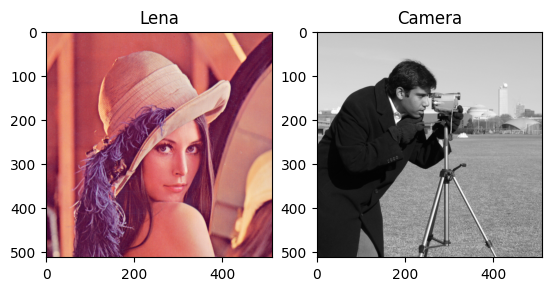

In [ ]:
from skimage import data
from matplotlib import pyplot as plt
import urllib.request

# --- Load the images ---
HTTP_response = urllib.request.urlopen('http://www.image.ntua.gr/~tpar/LABimage/lena.png')
arr = np.asarray(bytearray(HTTP_response.read()), dtype=np.uint8)
lena = cv2.imdecode(arr,-1)  # open cv uses bgr instead of rgb
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)
camera = data.camera()

plt.figure()

plt.subplot(121)
plt.imshow(lena)
plt.title('Lena')

plt.subplot(122)
plt.imshow(camera, cmap='gray')
plt.title('Camera')

plt.show()

We implement functions to display Gaussian and Laplacian Pyramids as well as compare the original with the reconstructed image (through L_Pyramid_Decode).

In [ ]:
#1
def display_pyramid(pyramid, title):
    plt.figure(figsize=(15, 5))
    for i, level in enumerate(pyramid):
        plt.subplot(1, len(pyramid), i+1)
        # Normalize for display if needed, [[DONT LOOK AT IMAGE SIZES BUT AT AXIS COORDINATES FOR PIXEL SIZE]
        if level.dtype != np.uint8:
            level_display = np.clip(level, 0, 255).astype(np.uint8)
        else:
            level_display = level

        if len(level.shape) == 3:  # Color image
            plt.imshow(level_display)
        else:  # Grayscale image
            plt.imshow(level_display, cmap='gray')
        plt.title(f'Level {i}')
    plt.suptitle(title, y=0.85)
    plt.tight_layout()
    plt.show()

def compare_Reconstructed_Image(L, a, I):
  reconstructed = L_Pyramid_Decode(L, a)
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  if len(I.shape) == 3:
      plt.imshow(I)
  else:
      plt.imshow(I, cmap='gray')
  plt.title('Original Image')
  plt.subplot(1, 2, 2)
  if len(I.shape) == 3:
      plt.imshow(np.clip(reconstructed, 0, 255).astype(np.uint8))
  else:
      plt.imshow(np.clip(reconstructed, 0, 255).astype(np.uint8), cmap='gray')
  plt.title('Reconstructed Image')
  plt.tight_layout()
  plt.show()

  # Check if the reconstruction is lossless
  cmp = (reconstructed == I).all()
  print(f"Is the reconstructed imaged equal to the original: {cmp}")


def test_pyramid(I, a=0.4, depth=4):
    # Generate and display Gaussian pyramid
    G = GPyramid(I, a, depth)
    display_pyramid(G, f'Gaussian Pyramid (a={a})')

    # Generate and display Laplacian pyramid
    L = LPyramid(I, a, depth)
    display_pyramid(L, f'Laplacian Pyramid (a={a})')

    # Reconstruct and display the image
    compare_Reconstructed_Image(L, a, I)

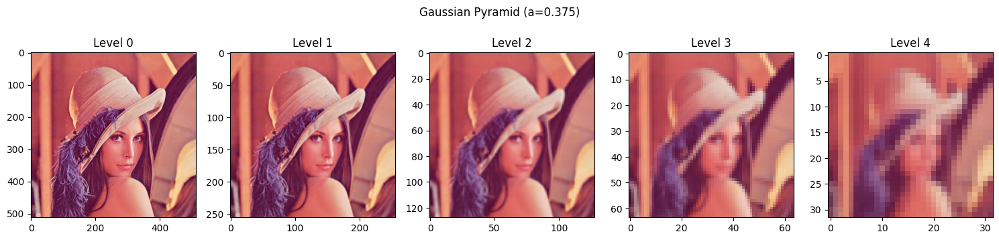

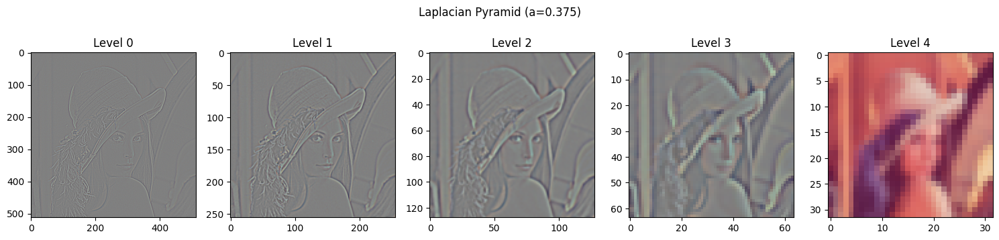

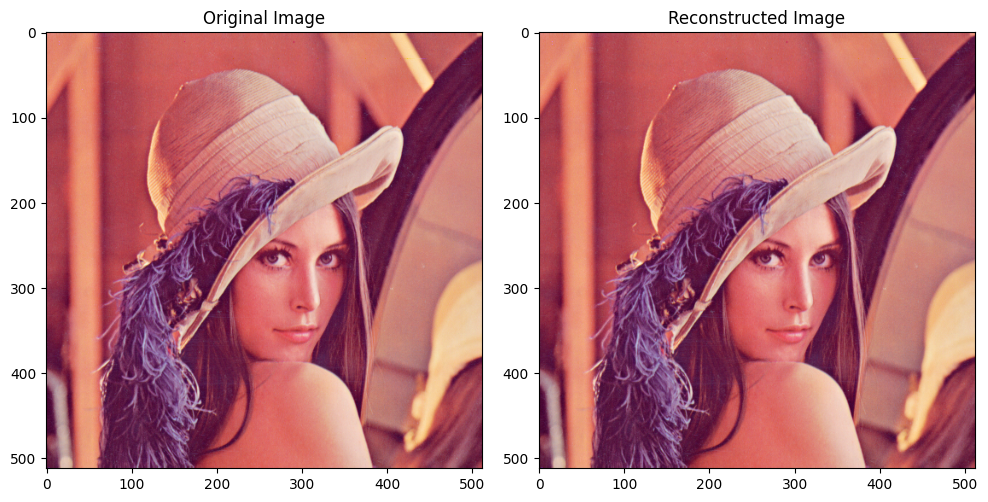

Is the reconstructed imaged equal to the original: True


In [ ]:
test_pyramid(lena, a=0.375, depth=4)
# grayscale laplacian for rgb image seems to be expected, tested it in the given lab

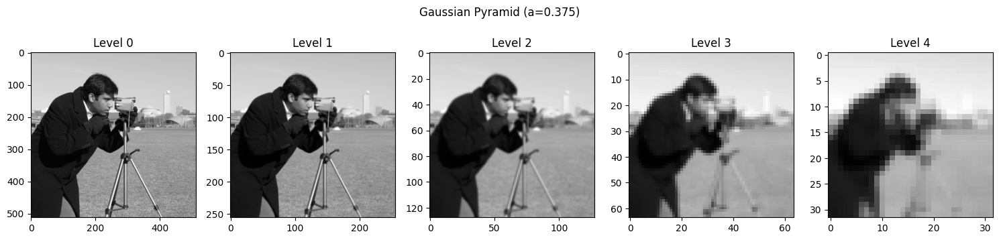

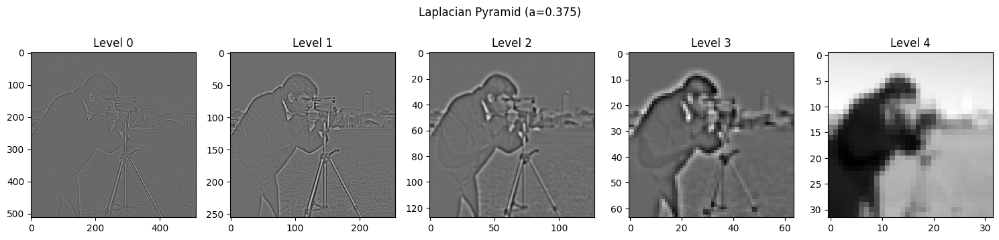

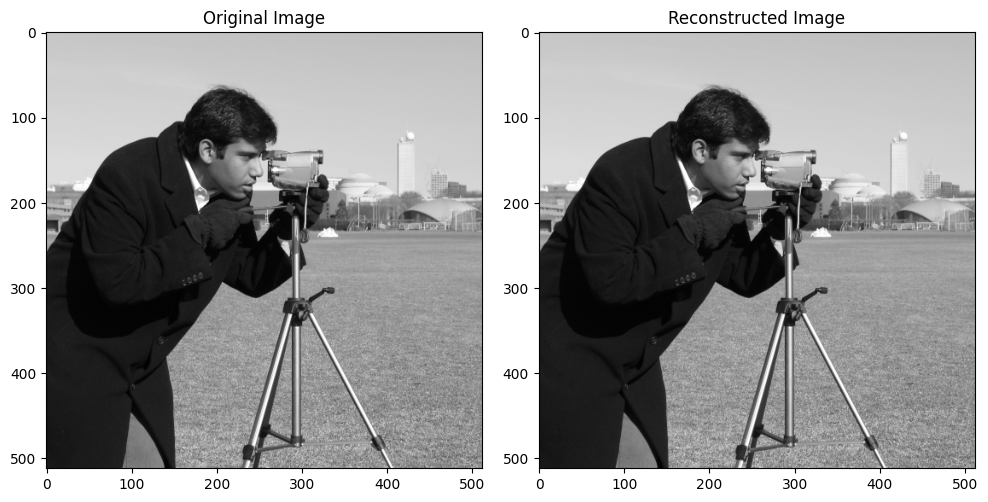

Is the reconstructed imaged equal to the original: True


In [ ]:
test_pyramid(camera, a=0.375, depth=4)

The previous results are as expected. As we move to the higher levels in the Gaussian Pyramid, the image becomes more blurred due to the Gaussian filter, while in the Laplacian Pyramid, the images initially capture the "fine" features, and as we move towards the higher levels, we observe increasingly "coarse" features. Finally, the reconstruction is always correct, as expected, since compression with the Laplacian Pyramid without quantization is lossless.

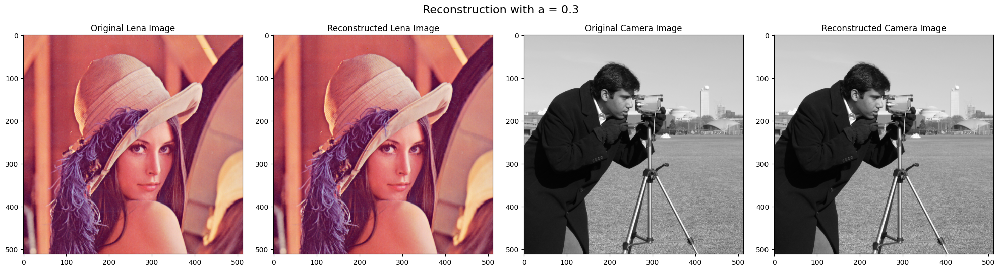

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


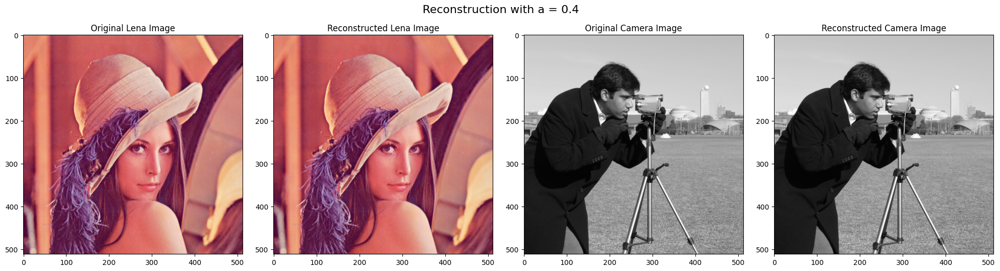

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


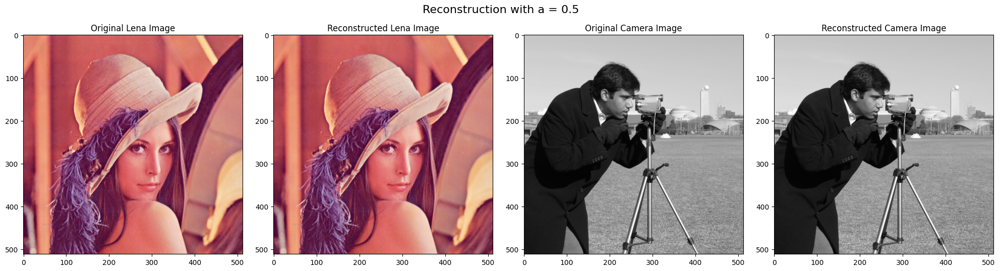

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


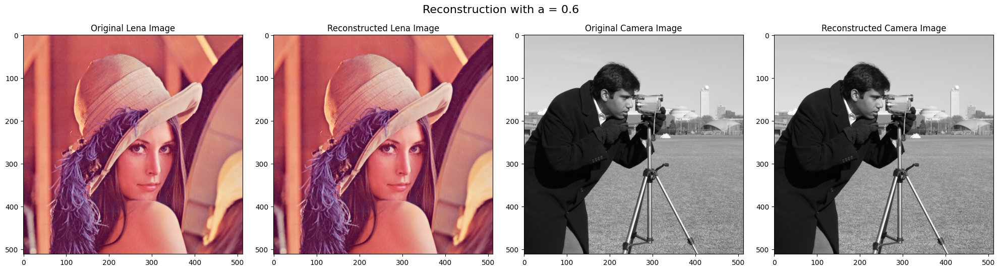

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


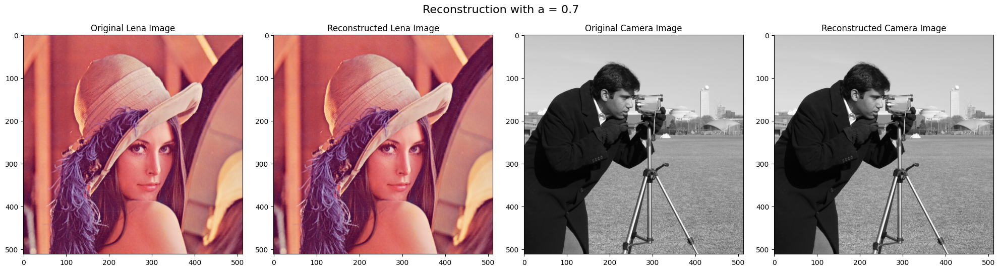

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


In [ ]:
#2
avalues = [0.3, 0.4, 0.5, 0.6, 0.7]
for a in avalues:
  L_lena = LPyramid(lena, a, 4)
  L_camera = LPyramid(camera, a, 4)
  reconstructed_lena = L_Pyramid_Decode(L_lena, a)
  reconstructed_camera = L_Pyramid_Decode(L_camera, a)

  plt.figure(figsize=(20, 5))
  plt.suptitle(f'Reconstruction with a = {a}', fontsize=16, y=1.02)

  plt.subplot(1, 4, 1)
  plt.imshow(lena)
  plt.title('Original Lena Image')

  plt.subplot(1, 4, 2)
  plt.imshow(np.clip(reconstructed_lena, 0, 255).astype(np.uint8))
  plt.title('Reconstructed Lena Image')

  plt.subplot(1, 4, 3)
  plt.imshow(camera, cmap="gray")
  plt.title('Original Camera Image')

  plt.subplot(1, 4, 4)
  plt.imshow(np.clip(reconstructed_camera, 0, 255).astype(np.uint8), cmap="gray")
  plt.title('Reconstructed Camera Image')

  plt.tight_layout()
  plt.show()

  print(f"Perfect Lena reconstruction: {(reconstructed_lena == lena).all()}")
  print(f"Perfect Camera reconstruction: {(reconstructed_camera == camera).all()}")

We see that regardless of the value of α we test, the reconstruction is always correct, which we expected since compression with the Laplacian Pyramid is always lossless as long as there is no quantization.

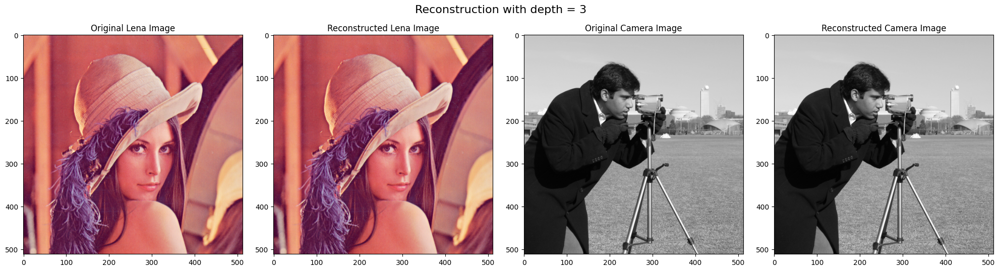

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


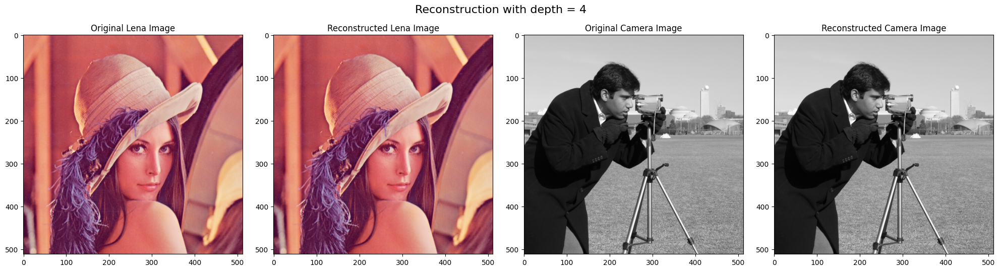

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


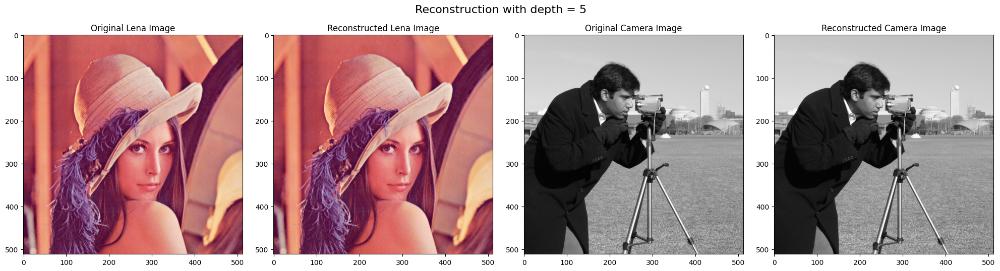

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


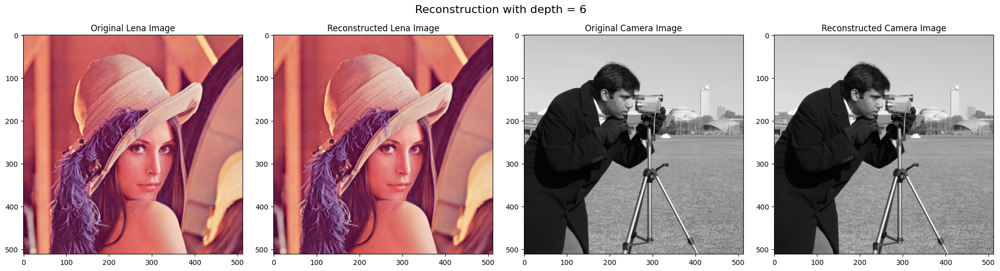

Perfect Lena reconstruction: True
Perfect Camera reconstruction: True


In [ ]:
#3
dvalues = [3, 4, 5, 6]
for d in dvalues:
  L_lena = LPyramid(lena, 0.375, d)
  L_camera = LPyramid(camera, 0.375, d)
  reconstructed_lena = L_Pyramid_Decode(L_lena, 0.375)
  reconstructed_camera = L_Pyramid_Decode(L_camera, 0.375)

  plt.figure(figsize=(20, 5))
  plt.suptitle(f'Reconstruction with depth = {d}', fontsize=16, y=1.02)

  plt.subplot(1, 4, 1)
  plt.imshow(lena)
  plt.title('Original Lena Image')

  plt.subplot(1, 4, 2)
  plt.imshow(np.clip(reconstructed_lena, 0, 255).astype(np.uint8))
  plt.title('Reconstructed Lena Image')

  plt.subplot(1, 4, 3)
  plt.imshow(camera, cmap="gray")
  plt.title('Original Camera Image')

  plt.subplot(1, 4, 4)
  plt.imshow(np.clip(reconstructed_camera, 0, 255).astype(np.uint8), cmap="gray")
  plt.title('Reconstructed Camera Image')

  plt.tight_layout()
  plt.show()

  print(f"Perfect Lena reconstruction: {(reconstructed_lena == lena).all()}")
  print(f"Perfect Camera reconstruction: {(reconstructed_camera == camera).all()}")


We see that regardless of the value of depth we test, the reconstruction is always correct, which we expected since compression with the Laplacian Pyramid is always lossless as long as there is no quantization.


We create a function that calculates the entropy of an image and calculate it for our 2 initial images.

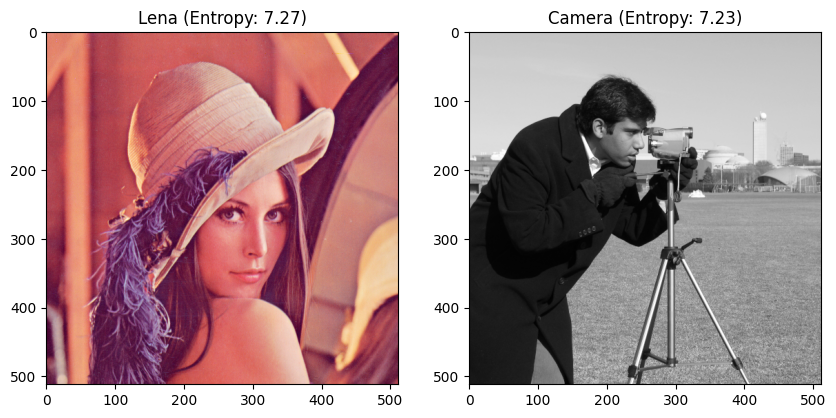

In [ ]:
#4
from scipy.stats import entropy
from sklearn.preprocessing import normalize

def calculate_entropy(image):
    if len(image.shape) > 2:
        # For color images, calculate entropy for each channel and average
        return np.mean([calculate_entropy(image[:,:,i]) for i in range(image.shape[2])])

    # Get histogram of pixel values
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256], density=True)

    # Remove zeros to avoid log(0)
    hist = hist[hist > 0]

    # Calculate entropy
    return -np.sum(hist * np.log2(hist))

# display the lena image and camera image alongside with their entropies
lena_entropy = calculate_entropy(lena)
camera_entropy = calculate_entropy(camera)

# --- Display Images and Entropies ---
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(lena)
plt.title(f'Lena (Entropy: {lena_entropy:.2f})')

plt.subplot(122)
plt.imshow(camera, cmap='gray')
plt.title(f'Camera (Entropy: {camera_entropy:.2f})')

plt.show()


In the following analysis (questions 4 and 5), we create 2 types of diagrams. The first shows the change in entropy with the change in the parameter α. The previous diagram is created for each level/image of the Laplacian Pyramid. The second diagram shows the entropy of each image/level for a specific value of α, and we have included various values of α. This will give us a complete picture of the relationship between entropy and the parameter α at all levels of the Laplacian Pyramid.


It is worth noting that it is redundant to test different depths since we are not checking reconstruction, and that for the following diagrams, a large depth also includes the results for the smaller depths within it. Therefore, in the following, max_depth = 6 has been used.

In [ ]:
def analyze_laplacian_entropy(image, a_values, depths):
    results = {
        'a_values': a_values,
        'depths': depths,
        'level_entropy': {}
    }

    for i, a in enumerate(a_values):
        results['level_entropy'][a] = {}

        for j, depth in enumerate(depths):
            # Create Laplacian pyramid
            L = LPyramid(image, a, depth)

            # Calculate entropy for each level
            level_entropies = [calculate_entropy(level) for level in L]
            results['level_entropy'][a][depth] = level_entropies

    return results

def plot_entropy_results(results, title_prefix=""):
    a_values = results['a_values']
    depths = results['depths']
    max_depth = depths[-1]  # Use the maximum depth

    # Create a figure with subplots in a single row
    fig, axs = plt.subplots(1, max_depth, figsize=(4*max_depth, 5), sharey=True)

    # For each level, plot a_values vs entropy
    for level in range(max_depth):
        # Get entropy values for each a at this level
        entropy_values = []
        for a in a_values:
            entropy_values.append(results['level_entropy'][a][max_depth][level])

        # Plot a_values vs entropy for this level
        axs[level].plot(a_values, entropy_values, 'o-')
        axs[level].set_xlabel('a', fontsize=14)
        axs[level].set_title(f'Level {level}', fontsize=14)
        axs[level].grid(True)

    # Set y-label only for the leftmost subplot
    axs[0].set_ylabel('Entropy', fontsize=14)
    fig.suptitle(f'{title_prefix}Entropy vs a  by Pyramid Level (Depth={max_depth})', fontsize=18)
    plt.tight_layout()
    plt.show()

    # Plot entropy by level for each a value (fixed depth)
    plt.figure(figsize=(12, 8))

    for a in a_values:
        level_entropies = results['level_entropy'][a][max_depth]
        plt.plot(range(len(level_entropies)), level_entropies, 'o-', label=f'a={a}')

    plt.xlabel('Pyramid Level')
    plt.ylabel('Entropy')
    plt.title(f'{title_prefix}Entropy by Pyramid Level (Depth={max_depth})')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def run_comprehensive_analysis(img, is_color=True):
    # Define parameters to test
    a_values = [0.3, 0.4, 0.5, 0.6, 0.7]
    depths = [3, 4, 5, 6]

    # Run analysis
    print(f"Analyzing image")
    results = analyze_laplacian_entropy(img, a_values, depths)

    # Plot results
    image_type = "Lena" if is_color else "Camera"
    plot_entropy_results(results, title_prefix=f"{image_type} Image: ")

Analyzing image


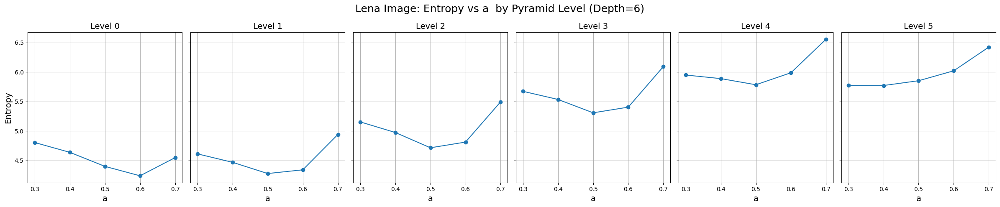

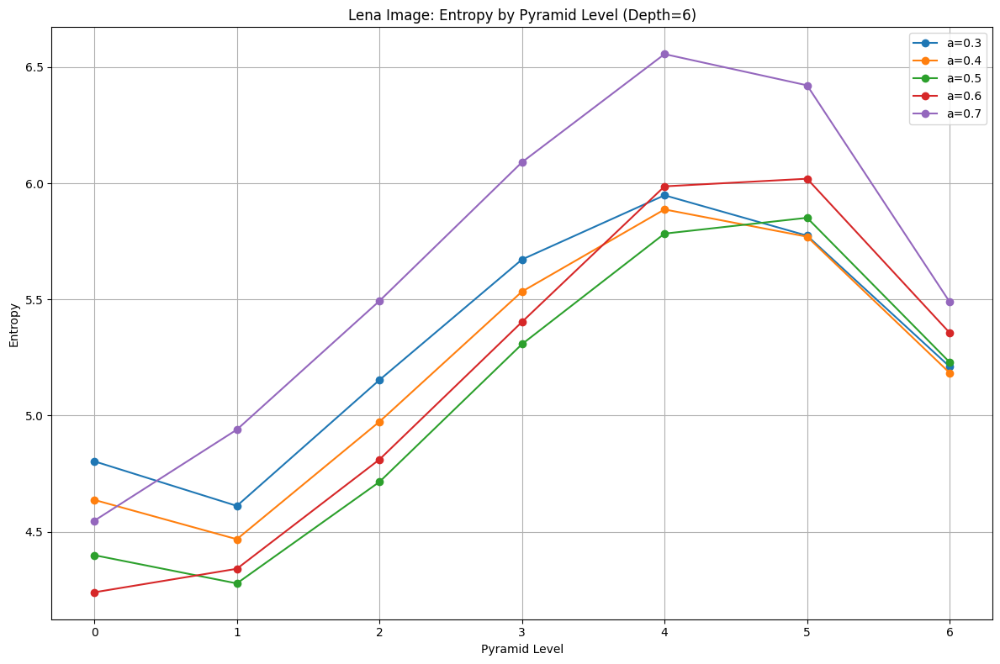

Analyzing image


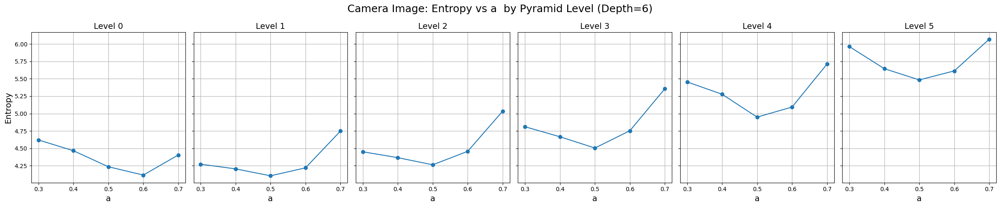

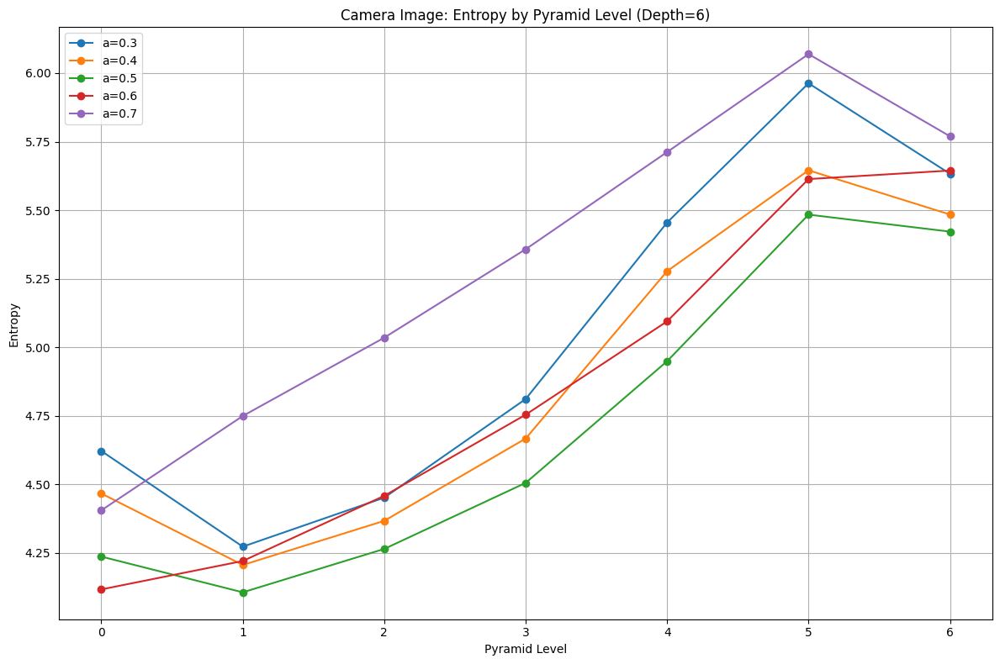

In [ ]:
# For a single image analysis:
run_comprehensive_analysis(lena, is_color=True)   # For color images
run_comprehensive_analysis(camera, is_color=False)  # For grayscale images

From the above, the entropy values for different α at the different levels of the pyramid are shown. Generally, as we go up levels in the pyramid, the entropy increases up to a point (level 5 - level 6), after which, if we had set a depth greater than 6, we would see that it would decrease until it becomes zero, since such high levels in the Gaussian Pyramid would have been completely altered, and therefore their difference would have no characteristics. Also, the parameter α that achieves the smallest entropy is the same at most levels and almost the same (+- 0.1) at the remaining levels.
For the values of α we tested [0.3, 0.4, 0.5, 0.6, 0.7]
We observe that for the optimal α, i.e., the one that corresponds to the smallest entropy and therefore the best compression, the following hold:
Lena L0: 0.6
Lena L1,L2,L3,L4: 0.5
Lena L5,L6: 0.4
Camera L0: 0.6
Camera L1,L2,L3,L4,L5,L6: 0.5
So overall (at least up to depth = 6), we see that for α belonging to [0.5, 0.6], we achieve the greatest image compression for both images, which is analogous to the result of the paper by Burt and Adelson.

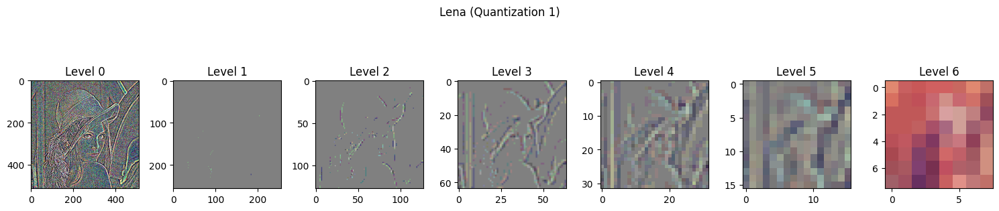

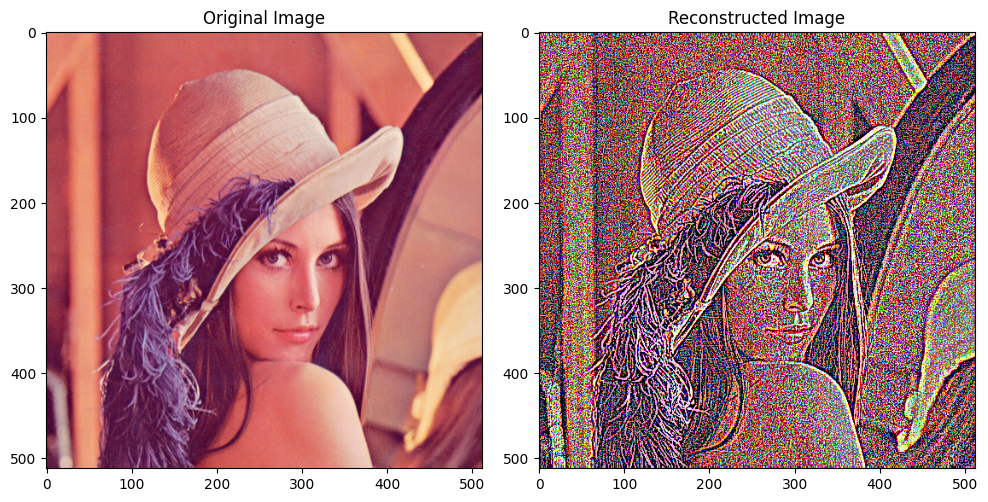

Is the reconstructed imaged equal to the original: False


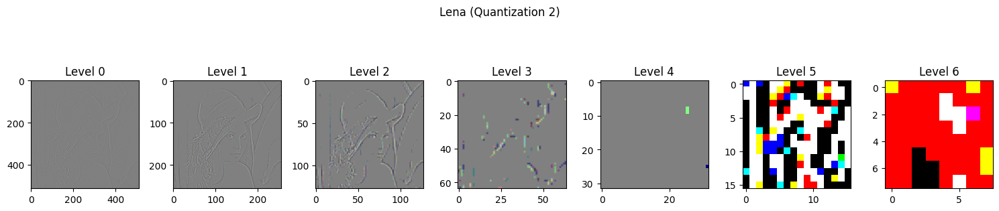

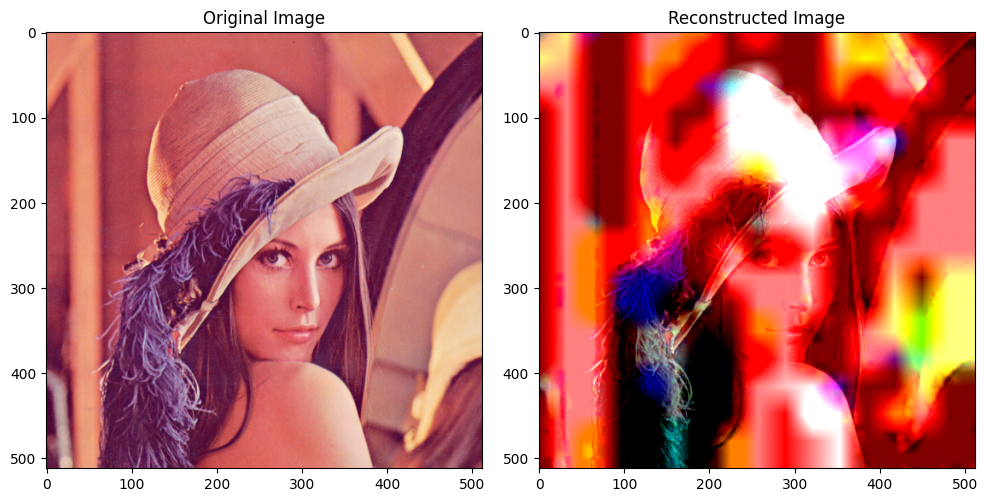

Is the reconstructed imaged equal to the original: False


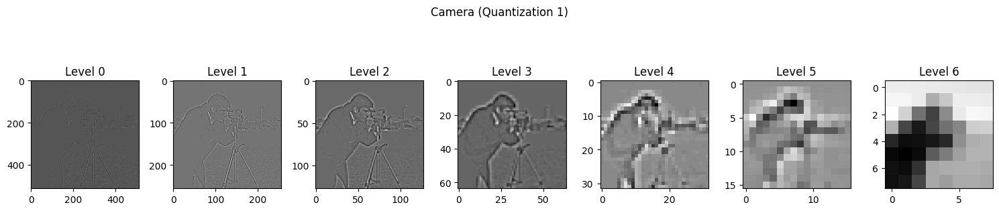

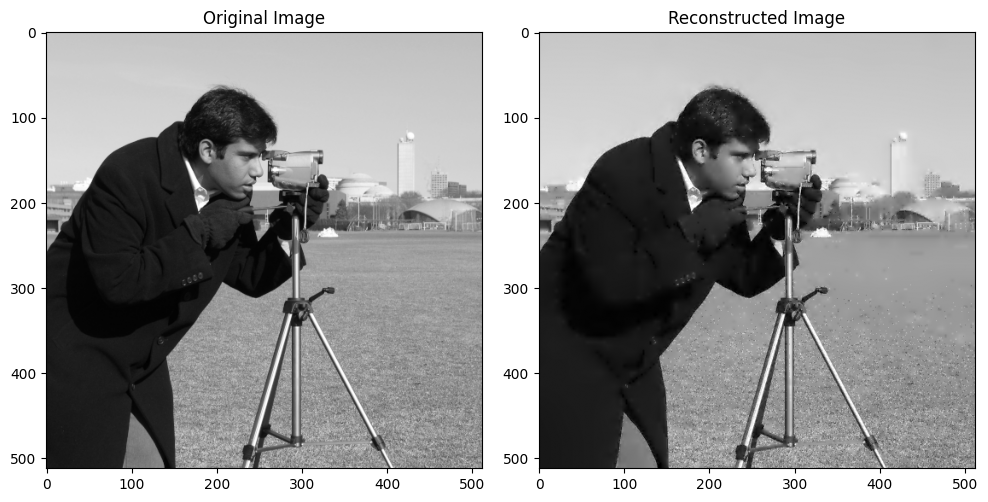

Is the reconstructed imaged equal to the original: False


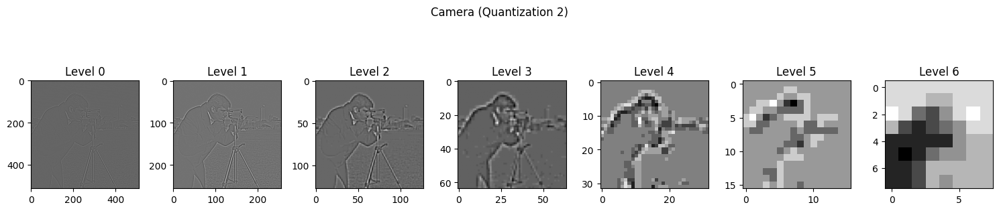

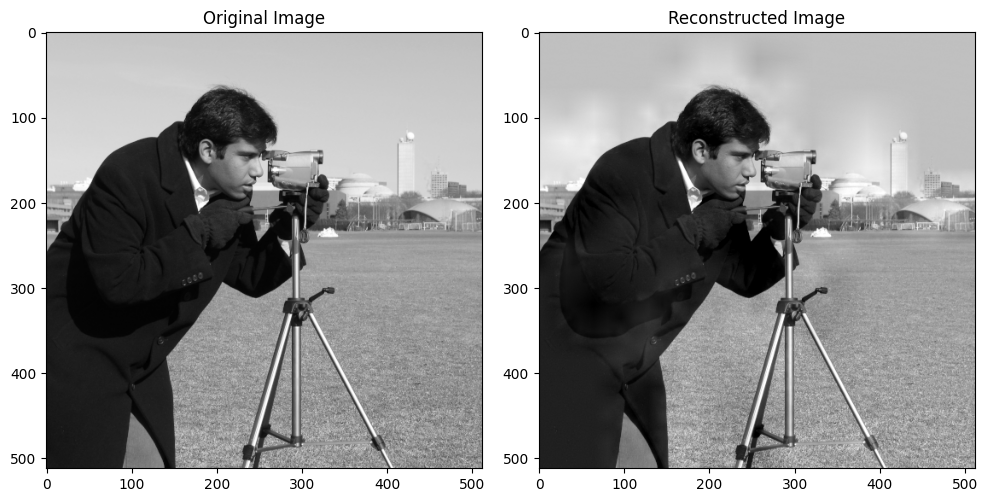

Is the reconstructed imaged equal to the original: False


In [ ]:
#6
a = 0.5
depth = 6
lenaPyr = LPyramid(lena, a, depth)
cameraPyr = LPyramid(camera, a, depth)

lena_quant_1 = L_Quantization(lenaPyr, [256, 128, 64, 32, 16, 8])
lena_quant_2 = L_Quantization(lenaPyr, [8, 16, 32, 64, 128, 256])
camera_quant_1 = L_Quantization(cameraPyr, [32, 16, 8, 4, 2, 1])
camera_quant_2 = L_Quantization(cameraPyr, [1, 2, 4, 8, 16, 32])

display_pyramid(lena_quant_1, "Lena (Quantization 1)")
compare_Reconstructed_Image(lena_quant_1, a, lena)
display_pyramid(lena_quant_2, "Lena (Quantization 2)")
compare_Reconstructed_Image(lena_quant_2, a, lena)
display_pyramid(camera_quant_1, "Camera (Quantization 1)")
compare_Reconstructed_Image(camera_quant_1, a, camera)
display_pyramid(camera_quant_2, "Camera (Quantization 2)")
compare_Reconstructed_Image(camera_quant_2, a, camera)


For quantization, what we mentioned in the theoretical part in questions c) and d) applies. That is, there is a trade-off between the degree of compression and image quality. A good strategy, which was mentioned, is large quantization (large bin size) at the low levels where there are high-frequency components that are not perceptible to the human eye, and small quantization (small bin size) at the high levels where there are medium/low-frequency components that the human eye recognizes. Thus, we achieve high compression without sacrificing much quality.
The previous strategy was used in the first experiment with the camera image, where the reconstructed image, although not identical to the original, has a difference that is not perceptible to the eye. While the opposite was applied in the second experiment, resulting in artifacts in the reconstructed image, i.e., our image was altered undesirably.